In [1]:
import os
os.chdir('/rd2/user/xiacr/sle/other_sc_data/')

In [157]:
import numpy as np
import pandas as pd
import scanpy as sc
import harmonypy as hm
import importlib

import glob
import anndata as ad
import collections

import scanpy.external as sce
from mycolorpy import colorlist as mcp
from IPython.display import display, HTML

# import utils
importlib.reload(utils)

<module 'utils' from '/rd2/user/xiacr/sle/other_sc_data/utils.py'>

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=160, facecolor='white', fontsize=10)
sc._settings.ScanpyConfig.n_jobs = 32

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.19.0 scipy==1.8.0 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.13.1 python-igraph==0.9.9 pynndescent==0.5.5


In [4]:
adata = sc.read_h5ad('./merge/pbmc_collect_meta_raw.h5ad')

In [5]:
adata.obs['orig.ident'].value_counts()

sample23                     18703
sample31                     18385
sample26                     17932
sample19                     17900
sample25                     17745
                             ...  
sle_1                         3542
XYY                           3287
SRR12122828_dbGaP-5256.h5     2868
LL                            1640
ebi_SLE2                      1322
Name: orig.ident, Length: 156, dtype: int64

## QC

In [6]:
sc.pp.filter_cells(adata, min_genes=300)
sc.pp.filter_genes(adata, min_cells=20)
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)


filtered out 8830 cells that have less than 300 genes expressed
filtered out 2163 genes that are detected in less than 20 cells


KeyError: "Could not find keys '['batch']' in columns of `adata.obs` or in adata.var_names."

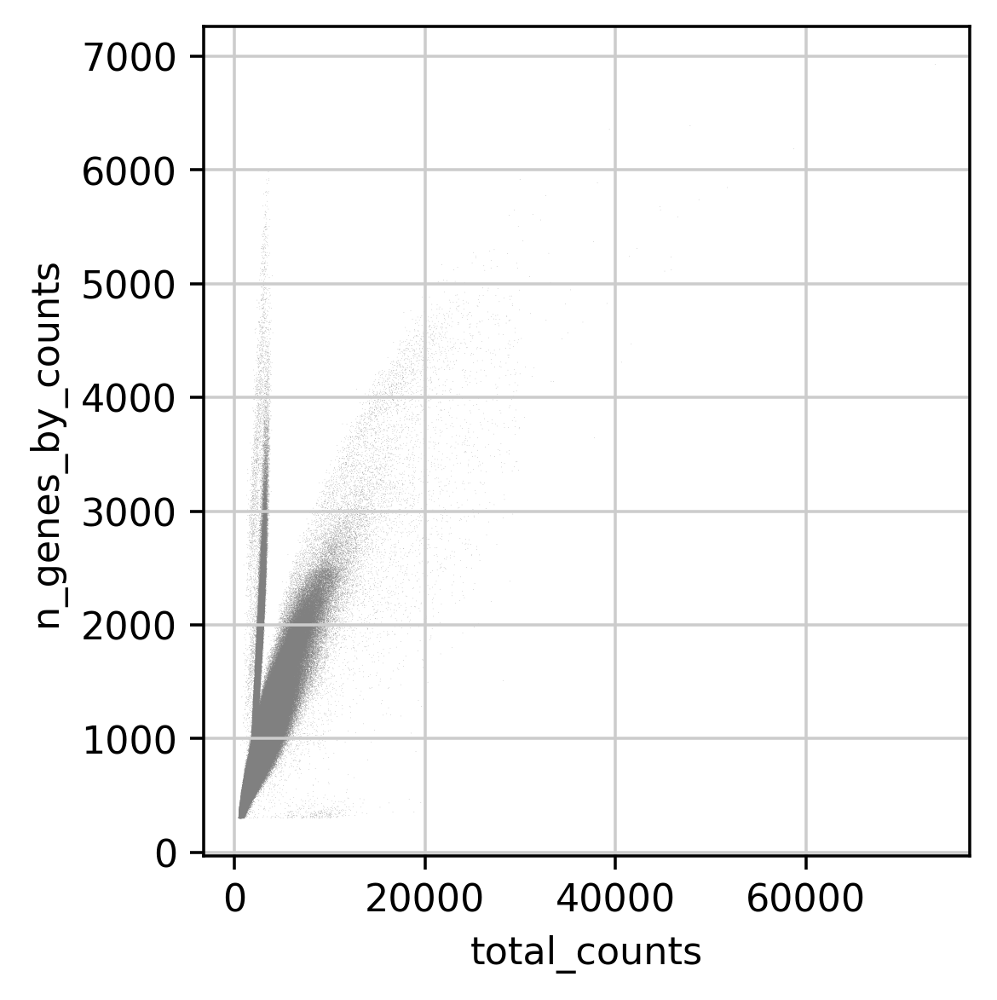

In [7]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [ ]:
# adata = adata[(adata.obs.n_genes_by_counts < 6000) & 
#               (adata.obs.total_counts < 40000) &
#               (adata.obs.pct_counts_mt <20) , :]

## single cell normal analysis

In [12]:
sc.pp.highly_variable_genes(adata, flavor ='seurat_v3',n_top_genes =2500, batch_key ='orig.ident') # must specify n_top_genes when using seurat v3
# sc.pl.highly_variable_genes(adata)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/home/xiacr/miniconda3/envs/sle/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:62: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [13]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:16)


In [14]:
adata.raw = adata # You can get back an AnnData of the object in .raw by calling .raw.to_adata().
adata = adata[:, adata.var.highly_variable]

In [28]:
# sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt']) # long time

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:06:56)


In [15]:
sc.pp.scale(adata, max_value=10)

/home/xiacr/miniconda3/envs/sle/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [16]:
sc.tl.pca(adata, svd_solver='arpack')
# sc.pl.pca_variance_ratio(adata, log=True, n_pcs =50)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:08:29)


## Harmony

In [ ]:
hm.run_harmony(data_mat, meta_data, vars_use)

In [ ]:
sce.pp.harmony_integrate(adata, 'orig.ident',theta=1)

2022-03-11 00:44:43,967 - harmonypy - INFO - Iteration 1 of 10
2022-03-11 01:10:36,203 - harmonypy - INFO - Iteration 2 of 10
2022-03-11 01:36:55,595 - harmonypy - INFO - Iteration 3 of 10


## Cluster and Vis

In [2]:
adata

NameError: name 'adata' is not defined

In [20]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=50,use_rep='X_pca_harmony' )
sc.tl.leiden(adata,resolution = 0.8)

sc.tl.umap(adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:04:01)
running Leiden clustering
    finished: found 31 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (1:23:19)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:53:39)


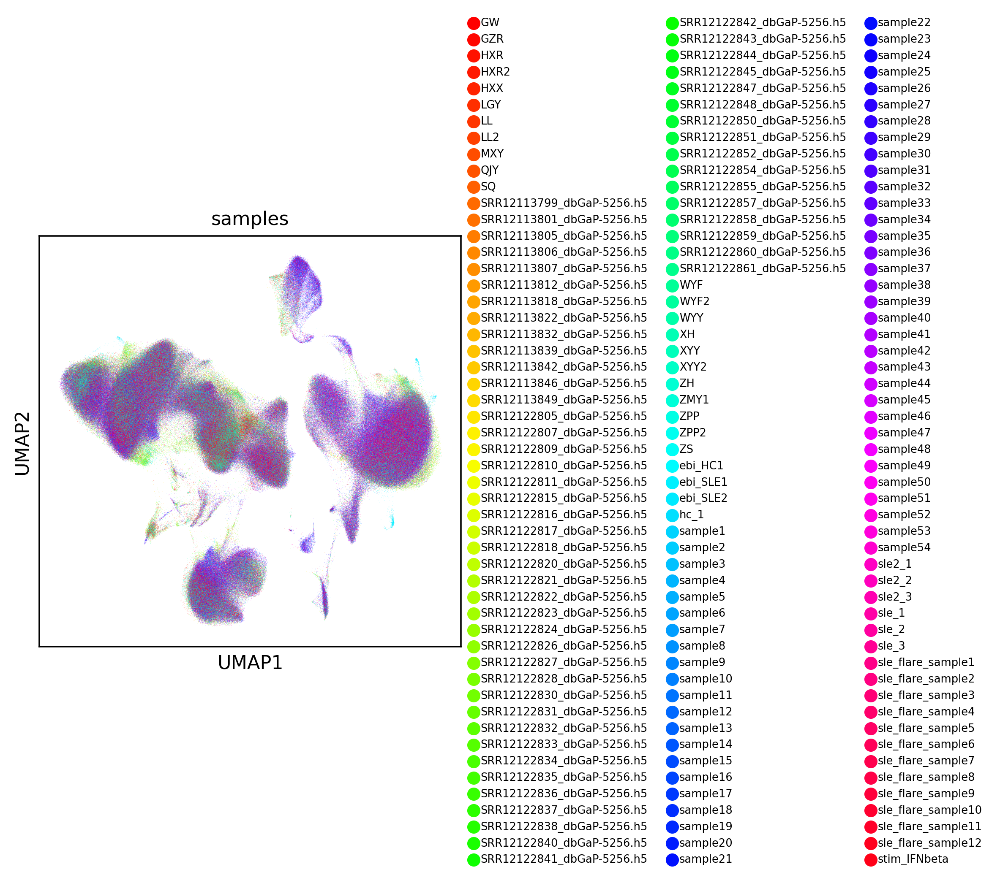

In [37]:
sc.pl.umap(adata,color=['orig.ident'], palette = mcp.gen_color(cmap="hsv",n=156),legend_fontsize='xx-small',outline_color='white',title='samples')

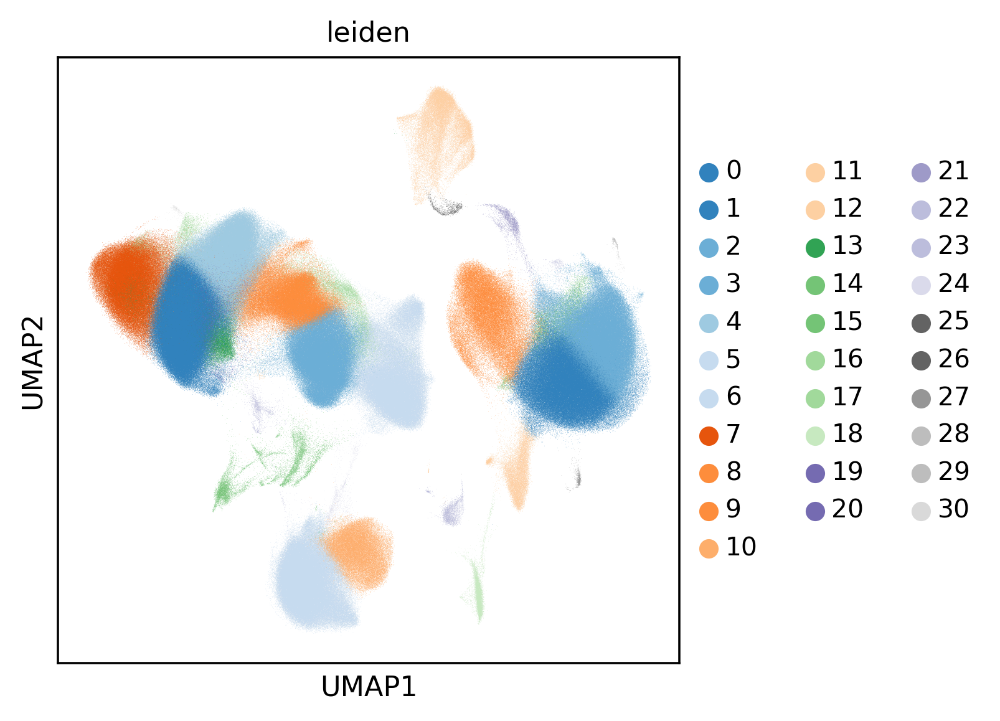

In [33]:
sc.pl.umap(adata,color=['leiden'], palette = mcp.gen_color(cmap="tab20c",n=32),title='cluster', legend_fontsize='xx-small')

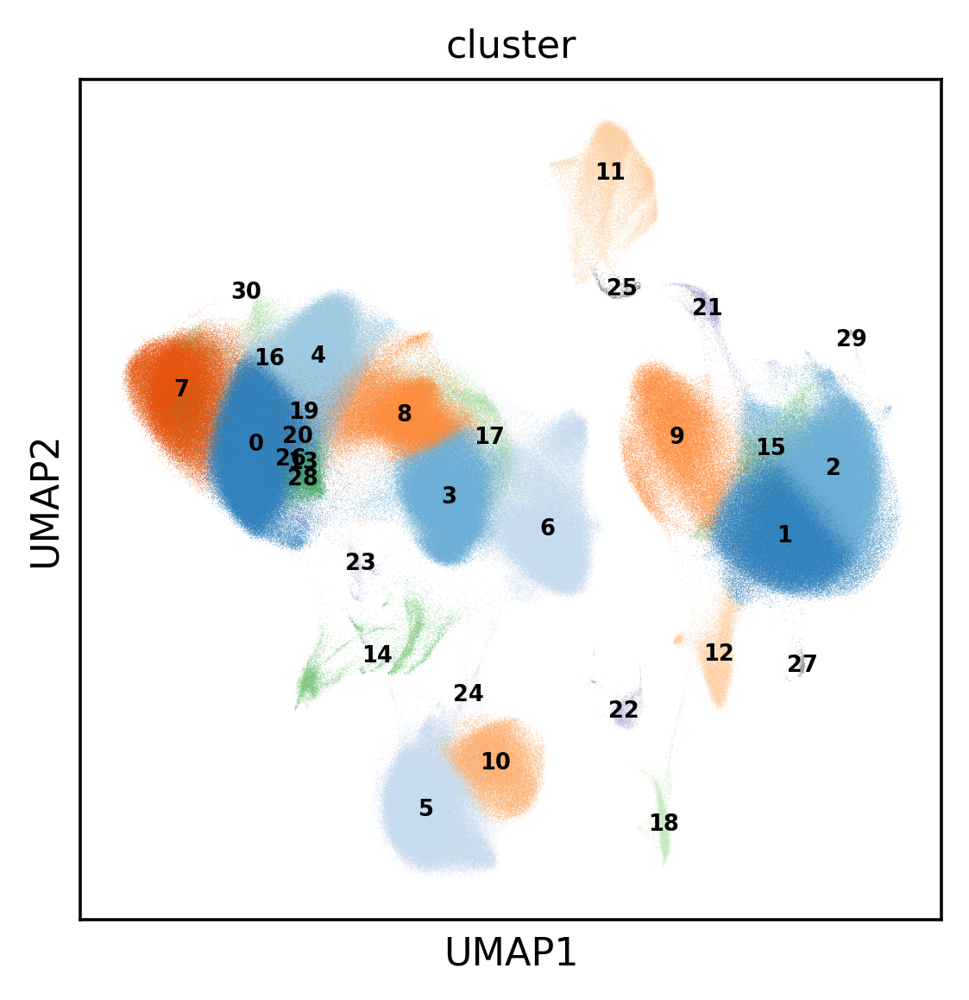

In [41]:
sc.pl.umap(adata,color=['leiden'], palette = mcp.gen_color(cmap="tab20c",n=32),title='cluster', legend_fontsize='xx-small', legend_loc = 'on data')

/home/xiacr/miniconda3/envs/sle/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'group' as categorical


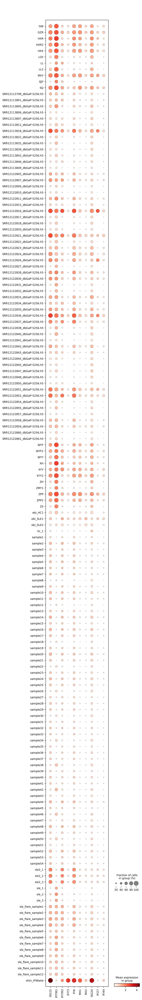

In [131]:
sc.pl.dotplot(adata, var_names= ['ISG15','IFITM1','IFITM3','IFIT3','IFI6','MX1','MX2','ISG20','IFI27','IFI44'], groupby='orig.ident');

In [165]:
# sc.tl.score_genes(adata, IFN_genes, ctrl_size=50, gene_pool=None, n_bins=25, score_name='IFN-score', random_state=0, copy=False, use_raw=None)
sc.tl.score_genes(adata,  ['ISG15','IFITM1','IFITM3','IFIT3','IFI6','MX1','MX2','ISG20','IFI27','IFI44'], ctrl_size=50, gene_pool=None, n_bins=25, score_name='IFN-score', random_state=0, copy=False, use_raw=None)

computing score 'IFN-score'


/home/xiacr/miniconda3/envs/sle/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'IFN-score', score of gene set (adata.obs).
    150 total control genes are used. (0:01:24)


In [166]:
# pd.options.display.max_columns = 200
df1 = pd.DataFrame(adata.obs.groupby('orig.ident')['IFN-score'].mean()).sort_values('IFN-score')
display(df1)
display(HTML(df1.to_html()))

,IFN-score
orig.ident,
SRR12113849_dbGaP-5256.h5,-0.233882
SRR12113806_dbGaP-5256.h5,-0.233168
SRR12122850_dbGaP-5256.h5,-0.224868
SRR12122820_dbGaP-5256.h5,-0.224028
SRR12122845_dbGaP-5256.h5,-0.221946
...,...
SRR12122821_dbGaP-5256.h5,0.830001
SRR12113818_dbGaP-5256.h5,1.008227
SRR12122836_dbGaP-5256.h5,1.035138


,IFN-score
orig.ident,
SRR12113849_dbGaP-5256.h5,-0.233882
SRR12113806_dbGaP-5256.h5,-0.233168
SRR12122850_dbGaP-5256.h5,-0.224868
SRR12122820_dbGaP-5256.h5,-0.224028
SRR12122845_dbGaP-5256.h5,-0.221946
SRR12122860_dbGaP-5256.h5,-0.221631
SRR12122841_dbGaP-5256.h5,-0.208970
SRR12122848_dbGaP-5256.h5,-0.208782
sample30,-0.201430


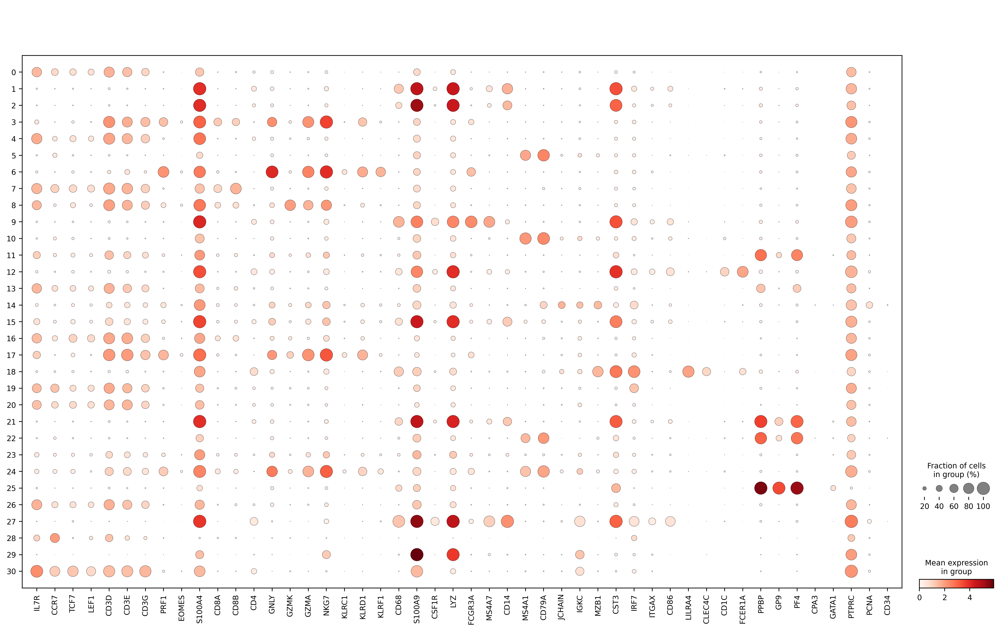

In [53]:
sc.pl.dotplot(adata, utils.marker_list, groupby='leiden');

In [55]:
adata.obs['leiden'].value_counts()

0     263956
1     171000
2     169432
3     144214
4     143785
5     139495
6     122513
7     119297
8      98837
9      69634
10     46479
11     36379
12     16870
13     15716
14     11992
15     10117
16      9545
17      9261
18      7153
19      5077
20      4536
21      3301
22      3239
23      2459
24      1589
25      1167
26       960
27       736
28       603
29       399
30       235
Name: leiden, dtype: int64

In [95]:
adata.obs["main_type"] = "unknown"
# adata.obs["main_type"][adata.obs.leiden.isin([11,21,22,25])] = 'Paltelet'
# adata.obs.main_type[adata.obs.leiden.isin([0,4,7,13,16,19,20,26,30])] = 'T.navie'
# adata.obs.main_type[adata.obs.leiden.isin([1,2,15])] = 'Mono.CD14'
# adata.obs.main_type[adata.obs.leiden.isin([3,8])] = 'T.cyto'
# adata.obs.main_type[adata.obs.leiden.isin([14])] = 'T.prolife'
# adata.obs.main_type[adata.obs.leiden.isin([5,10])] = 'Bcell'
# adata.obs.main_type[adata.obs.leiden.isin([6,17])] = 'NK'
# adata.obs.main_type[adata.obs.leiden.isin([9])] = 'Mono.CD16'
# adata.obs.main_type[adata.obs.leiden.isin([18])] = 'pDC'
# adata.obs.main_type[adata.obs.leiden.isin([12,27])] = 'cDC'


In [96]:
adata.obs.loc[adata.obs[(adata.obs.leiden.isin(['11','21','22','25']))].index.tolist(),'main_type'] = 'Paltelet'
adata.obs.loc[adata.obs[(adata.obs.leiden.isin(['0','4','7','13','16','19','20','26','30']))].index.tolist(),'main_type'] = 'T.navie'
adata.obs.loc[adata.obs[(adata.obs.leiden.isin(['1','2','15']))].index.tolist(),'main_type'] = 'Mono.CD14'
adata.obs.loc[adata.obs[(adata.obs.leiden.isin(['3','8']))].index.tolist(),'main_type'] = 'T.cyto'
adata.obs.loc[adata.obs[(adata.obs.leiden.isin(['14']))].index.tolist(),'main_type'] = 'Profiling.cells'
adata.obs.loc[adata.obs[(adata.obs.leiden.isin(['5','10']))].index.tolist(),'main_type'] = 'Bcell'
adata.obs.loc[adata.obs[(adata.obs.leiden.isin(['6','17']))].index.tolist(),'main_type'] = 'NK'
adata.obs.loc[adata.obs[(adata.obs.leiden.isin(['9']))].index.tolist(),'main_type'] = 'Mono.CD16'
adata.obs.loc[adata.obs[(adata.obs.leiden.isin(['18']))].index.tolist(),'main_type'] = 'pDC'
adata.obs.loc[adata.obs[(adata.obs.leiden.isin(['12','27']))].index.tolist(),'main_type'] = 'cDC'
adata.obs["main_type"].value_counts()

T.navie            563107
Mono.CD14          350549
T.cyto             243051
Bcell              185974
NK                 131774
Mono.CD16           69634
Paltelet            44086
cDC                 17606
Profiling.cells     11992
pDC                  7153
unknown              5050
Name: main_type, dtype: int64

/home/xiacr/miniconda3/envs/sle/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'main_type' as categorical


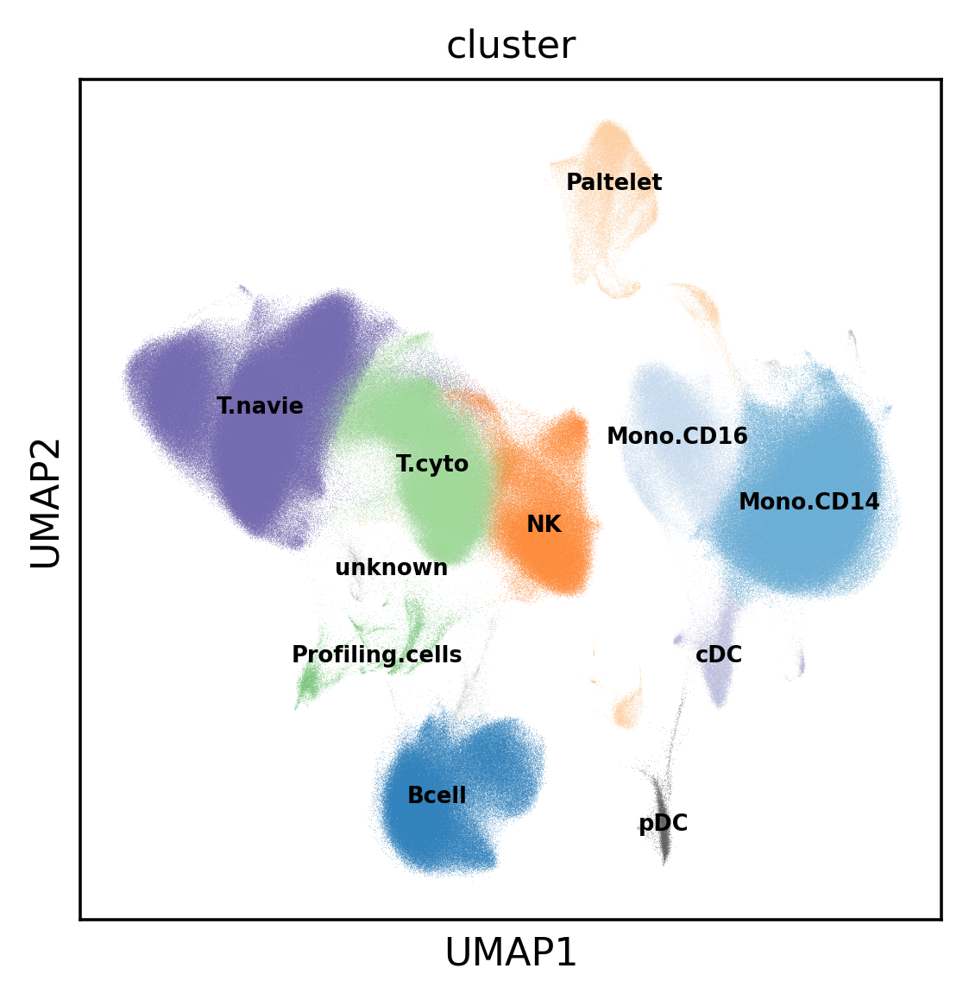

In [97]:
sc.pl.umap(adata,color=['main_type'], palette = mcp.gen_color(cmap="tab20c",n=12),title='cluster', legend_fontsize='xx-small', legend_loc = 'on data')

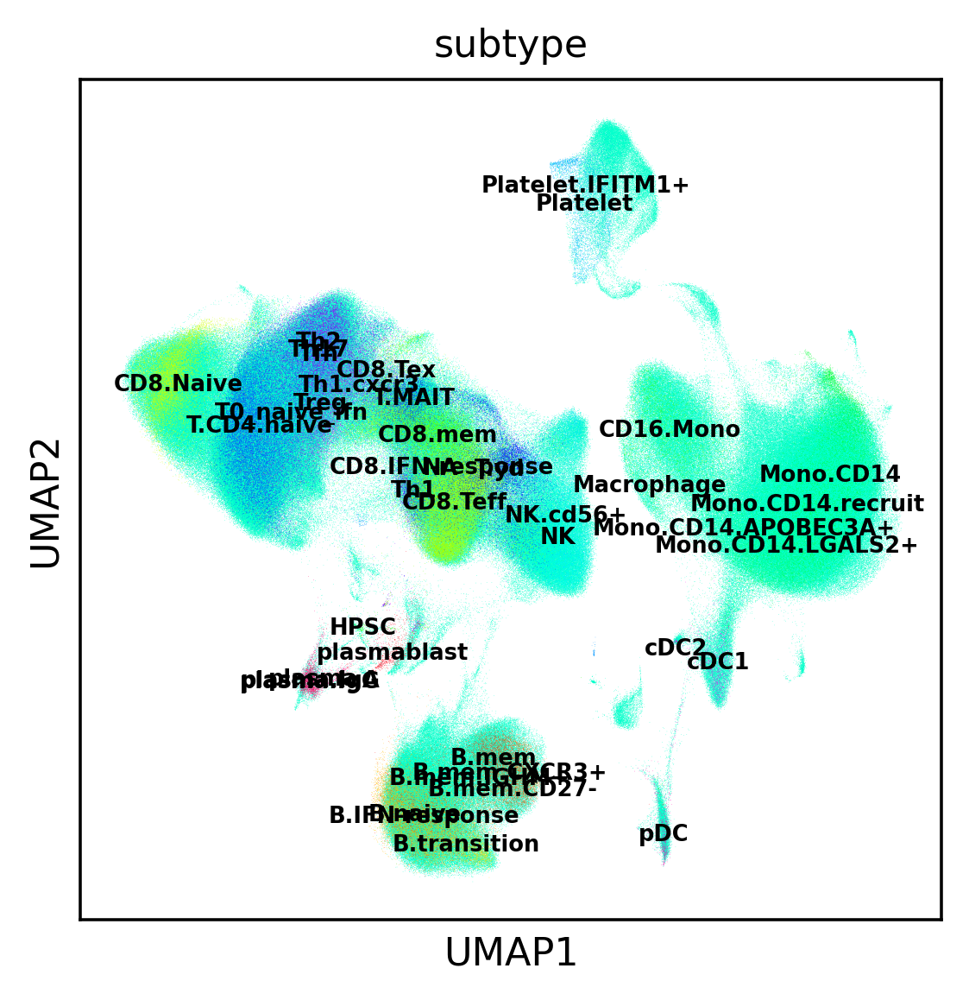

In [93]:
sc.pl.umap(adata,color=['subtype'], palette = mcp.gen_color(cmap="hsv",n=41),title='subtype', legend_fontsize='xx-small', legend_loc = 'on data')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_main_type']`


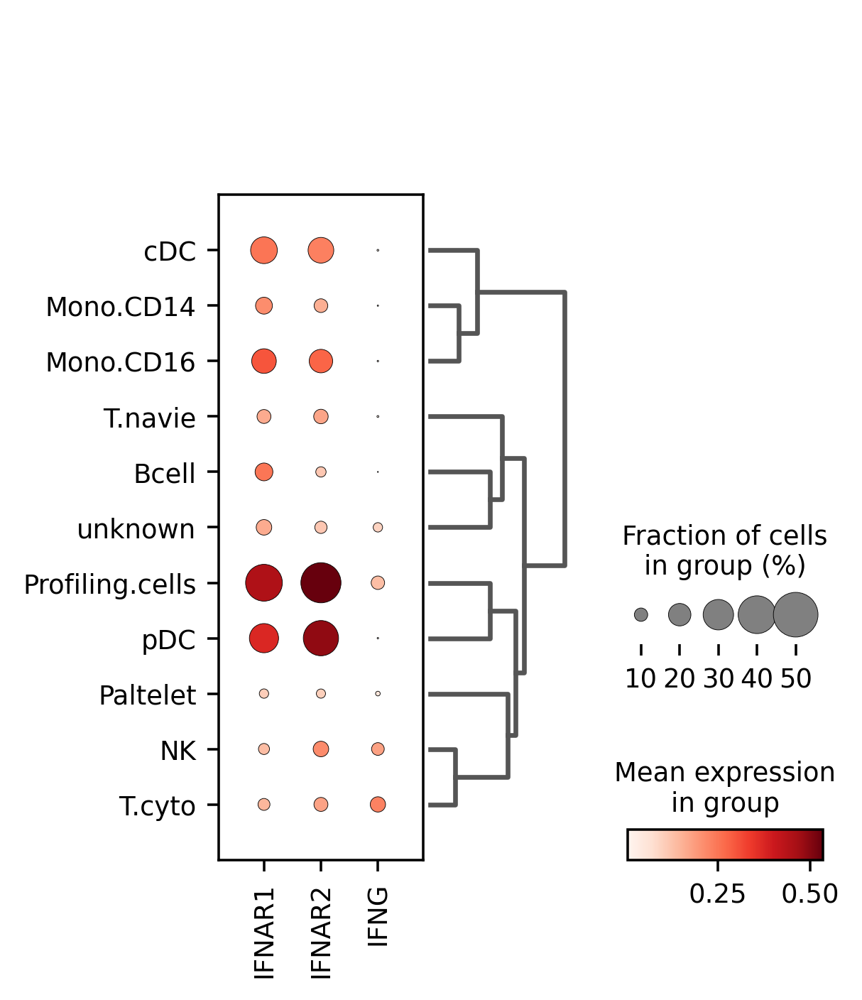

In [111]:
# sc.pl.violin(adata, ['IFNAR1', 'IFNAR2', 'IFNG'], groupby='main_type',size=0,multi_panel=True,rotation=90)
sc.pl.dotplot(adata, ['IFNAR1', 'IFNAR2', 'IFNG'], 'main_type', dendrogram=True)

In [112]:
tmp = adata[adata.obs.main_type.isin(['pDC'])].copy()

In [123]:
tmp.obs['group'].value_counts()

sle    6889
hc      264
Name: group, dtype: int64

In [121]:
tmp.obs["group"] = "sle"
tmp.obs.loc[tmp.obs[(tmp.obs['orig.ident'].isin(['ZS','QJY','hc_1','ZMY1','ZH','hc2_1','hc_2']))].index.tolist(),'group'] = 'hc'

<AxesSubplot:xlabel='gene', ylabel='value'>

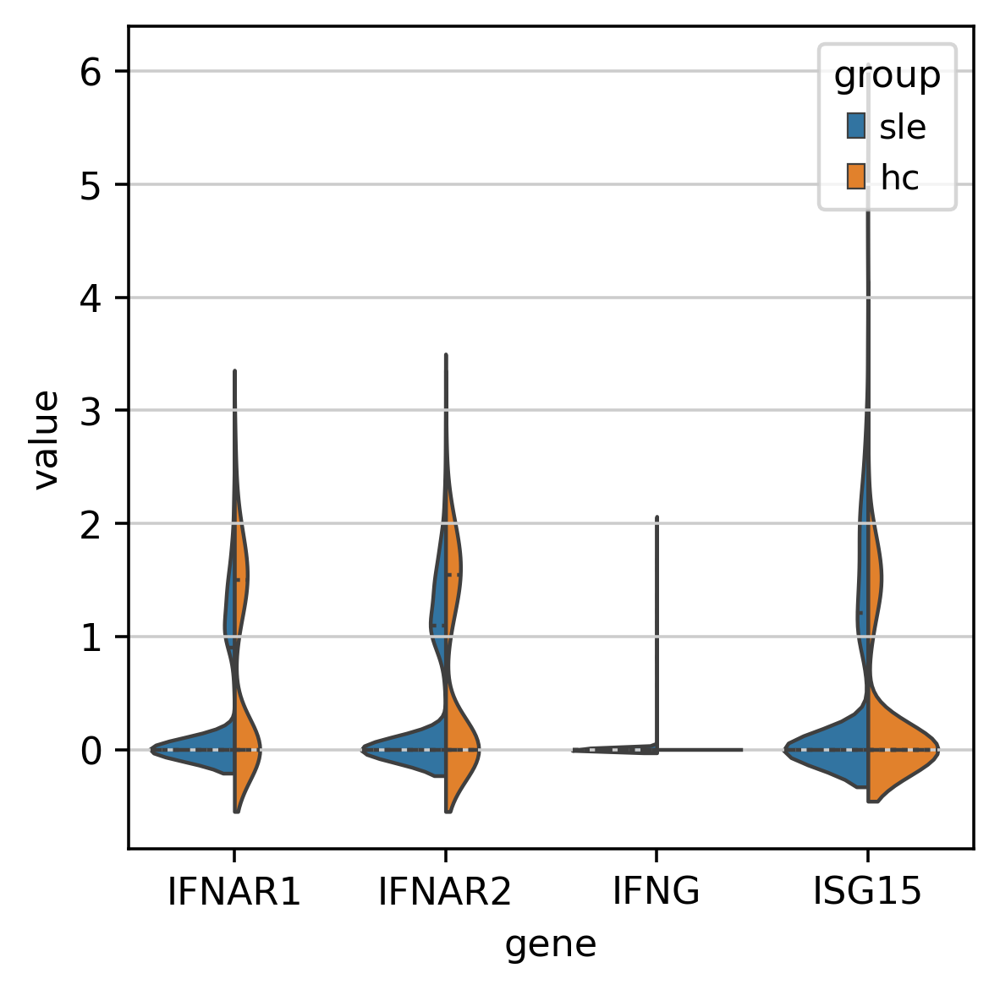

In [130]:
# tmp = adata[adata.obs.main_type.isin(['pDC'])].copy()
df = sc.get.obs_df(tmp, [ 'IFNAR1', 'IFNAR2','IFNG','ISG15','group'],use_raw=True)
df = df.set_index('group').stack().reset_index()
df.columns = ['group', 'gene', 'value']
import seaborn as sns
sns.violinplot(data=df, x='gene', y='value', hue="group",
                split=True, inner="quart", linewidth=1,scale='area')       

In [132]:
adata.write_h5ad(filename='./test_hamrmony_156samples.h5ad')

In [168]:
import sys
def sizeof_fmt(num, suffix='B'):
    ''' by Fred Cirera,  https://stackoverflow.com/a/1094933/1870254, modified'''
    for unit in ['','Ki','Mi','Gi','Ti','Pi','Ei','Zi']:
        if abs(num) < 1024.0:
            return "%3.1f %s%s" % (num, unit, suffix)
        num /= 1024.0
    return "%.1f %s%s" % (num, 'Yi', suffix)

for name, size in sorted(((name, sys.getsizeof(value)) for name, value in locals().items()),
                         key= lambda x: -x[1])[:10]:
    print("{:>30}: {:>8}".format(name, sizeof_fmt(size)))

AttributeError: 'AnnData' object has no attribute '_X'

In [1]:
adata

NameError: name 'adata' is not defined